
<font color = 'black'>
<h4>*** pyHXExpress examples ***</h4> 
https://github.com/tuttlelm/pyHXExpress
<p>
Bimodal analysis of HSPB5 datasets for WT, D109H, and R120G. Data origionally published in https://doi.org/10.1101/2022.05.30.493970
<br>
This analysis is presented in the pyHXExpress publication "A framework for automated multimodal HDX-MS analysis" by Tuttle, LM, Klevit, RE and Guttman, M


In [ ]:
import os
import importlib
import sys

# this is just to run directly from the python scripts if e.g. pip install wasn't used and
# the scripts aren't in the same directory as the current Jupyter Notebook file
# hxex_path = os.path.join('/data/HDX-MS/pyHXExpress')
# sys.path.append(hxex_path)

import hxex
import numpy as np, pandas as pd
import config_b5disease_1pop as config
from datetime import datetime

pd.set_option('display.max_columns',None)

now = datetime.now()
date = now.strftime("%d%b%Y")

def hxex_reload():
    importlib.reload(hxex)
    importlib.reload(config)
    hxex.config = config

hxex_reload()

###     PyHDX documentation, Examples
###     https://pyhdx.readthedocs.io/en/stable/examples.html
###
#!pip install pyhdx

import proplot as pplt
from scipy.optimize import lsq_linear
from pathlib import Path
#import yaml
from Bio import SeqIO
from collections import defaultdict

from pyhdx.models import Coverage
from pyhdx.plot import peptide_coverage
from pyhdx.batch_processing import StateParser
from pyhdx.fitting import fit_d_uptake
from pyhdx.config import cfg
from pyhdx import read_dynamx, HDXMeasurement
from pyhdx.fitting import fit_rates_half_time_interpolate, fit_rates_weighted_average, fit_gibbs_global
from pyhdx.process import filter_peptides, apply_control, correct_d_uptake
from dask.distributed import Client
from pyhdx.plot import dG_scatter_figure
import pyhdx.plot

from collections import defaultdict

import warnings
warnings.simplefilter (action='ignore', )#category=FutureWarning)
warnings.filterwarnings (action='ignore',)# category=RuntimeWarning,)

pd.set_option('display.max_columns',None)

import hxex_utils
importlib.reload(hxex_utils)
from hxex_utils import convert_to_uptakedf, combine_batch_data, hdexa_to_pyhdx, plot_coverage
from hxex_utils import plot_rfu_residue,choose_fits,plot_resred,plot_comparison,collate_pdfs, group_fits, get_residues

TD_time = 1e6
UN_time = 0

In [2]:
# read in data from batch run, combine, create uptake dataframe, and convert to pyhdx measurement object
# raw and peakpicked data is also available in each batch_dir as a .zip or .csv file (not used for this post processing analysis)
# HDXMeasurements: "Supplied data is made 'uniform' such that all timepoints have the same peptides"
#     peptide data has already been thoroughly curated for the original Woods et al publication, but
#     some additonal elimination of low quality data is necessary for the bimodal analysis 

low_pop = 0.03 #consider 'low quality' fit if population below this threshold
batch_dir = {}
samples = {}
states = {}
states12 = {} #this groups _pop1 together then _pop2
pepdata = {}
hdxm_hxex = defaultdict(dict)
proj_dir = os.path.join(os.getcwd(),'HSPB5_analysis') # folder for saving plots and outputs
if not os.path.exists(proj_dir): os.makedirs(proj_dir)
# assumes data from same source: config.Data_DIR
batch_dir['fixed1pop'] = os.path.join(proj_dir,'batchrun_1pop') # <--- fixed 1 pop run
batch_dir['fixed2pops'] = os.path.join(proj_dir,'batchrun_2pop') # <--- fixed 2 pop run
#batch_dir['1or2pops'] = os.path.join(proj_dir,'batchrun_1or2pop') # <--- up to 2 pops, default selection criteria (e.g. > 5% pop, p_value > 0.05)
projects = list(batch_dir.keys())
for k in projects: samples[k] = ['WT','D109H','R120G']

#if batching based on samples, otherwise make dirs list as appropriate
# metadf = hxex.get_metadf(quiet=True)
# samples = metadf['sample'].unique()

metadf_comb, datafits_comb, fitparams_comb = {},{},{}
badlist = defaultdict(dict)
for proj in projects: badlist[proj] = []
badlist['all'] = ['45-4-1','186-4-1','11-4-1', '11-60-2','141-0.8-4','141-4-1','141-60-2','141-1e6-1','75-1e6-1','72-1e6-1'] # if peaks got missed, will be issue for all projects 
#badlist['fixed2pops'] = [] #bad s_ids per project


for proj in projects:
    dirs = []
    bad_dataid = []
    
    
    for sample in samples[proj]:
        dirs.append(os.path.join(batch_dir[proj],sample+"_run"))

    metadf_comb[proj], datafits_comb[proj], fitparams_comb[proj] = combine_batch_data(dirs)

    uptakedf = {}
    datafit = {}
    pepdata[proj] = pd.DataFrame()
    for p in samples[proj]:
        datafit[p] = datafits_comb[proj].copy()[datafits_comb[proj]['sample']==p]
        uptakedf[p] = convert_to_uptakedf(datafit[p],proj=p)
        pepdata[proj] = pd.concat([pepdata[proj],hdexa_to_pyhdx(uptakedf[p],keepTD=True)])

    pepdata[proj] = pepdata[proj].reset_index()

    if 'quality' not in pepdata[proj].columns: pepdata[proj]['quality']='Medium'

    #low quality if fraction uptake more than 10% outside of Un-TD envelope
    ###bad_dataid = pepdata[proj][pepdata[proj]['rfu']>1.1].index.tolist() #['data_id'].values.tolist()  ## Do not filter by RFU here, do that at ChooseFit step
    ###bad_dataid += pepdata[proj][pepdata[proj]['rfu']<-0.1].index.tolist() #['data_id'].values.tolist()
    ###bad_dataid += pepdata[proj][(pepdata[proj]['rfu']<0.1) & (pepdata[proj]['time']>0)].index.tolist() #emperically these are bad 
    #bad_dataid += pepdata[proj][pepdata[proj]['rfu_sd']>0.25].index.tolist() # not enough confidence in uptake value #may be inacurate/low due to lack of reps? 
    bad_dataid += pepdata[proj][pepdata[proj]['time'].isin([0.1,0.8])].index.tolist()  #drop ms timepoints as they arent reliable and limit overall usable peptides due to 'uniform'
    #bad_dataid = pepdata[proj][pepdata[proj]['pop']<low_pop].index.tolist() #['data_id'].values.tolist()
    bad_dataid += hxex.filter_df(pepdata[proj],s_ids=badlist[proj]).index.tolist()
    bad_dataid += hxex.filter_df(pepdata[proj],s_ids=badlist['all']).index.tolist()
    bad_dataid = set(bad_dataid)
    pepdata[proj].loc[bad_dataid,'quality'] = 'Low' 

    sequence = {}
    for mutant in pepdata[proj]['state'].unique():
        fasta_sequence =  SeqIO.parse(open(os.path.join(config.Data_DIR,str(mutant.split('_')[0])+'.fasta')),'fasta')
        for fasta in fasta_sequence:
            sequence[mutant] = str(fasta.seq)
        use_data = pepdata[proj].copy()[(pepdata[proj]["state"]==mutant) & (pepdata[proj]["quality"]!="Low")]
        hdxm_hxex[proj][mutant] = HDXMeasurement(use_data, temperature=303.15, pH=8., sequence=sequence[mutant])
    
    proj_keys = list(hdxm_hxex[proj].keys())
    states[proj] = []
    for sample in samples[proj]:
        states[proj] += [ki for ki in proj_keys if sample == ki.rsplit('_',1)[0]]
    states12[proj] = [s for s in states[proj] if '_pop1' in s] + [s for s in states[proj] if '_pop2' in s] 



In [3]:
# #combine output plots from each batch directory (keeps samples separate)
# for proj in projects:
#     for sample in samples[proj]:
#         pdf_dir = os.path.join(batch_dir[proj],sample+'_run')
#         #print(pdf_dir)
#         collate_pdfs(pdf_dir,project='HSPB5_NSphospho_'+sample+'_'+proj,save_dir=batch_dir[proj])

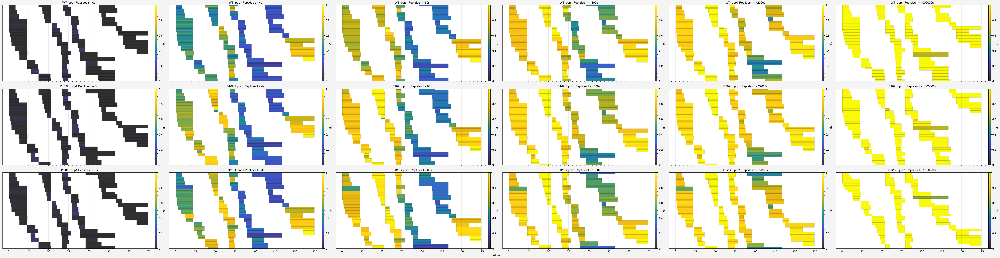

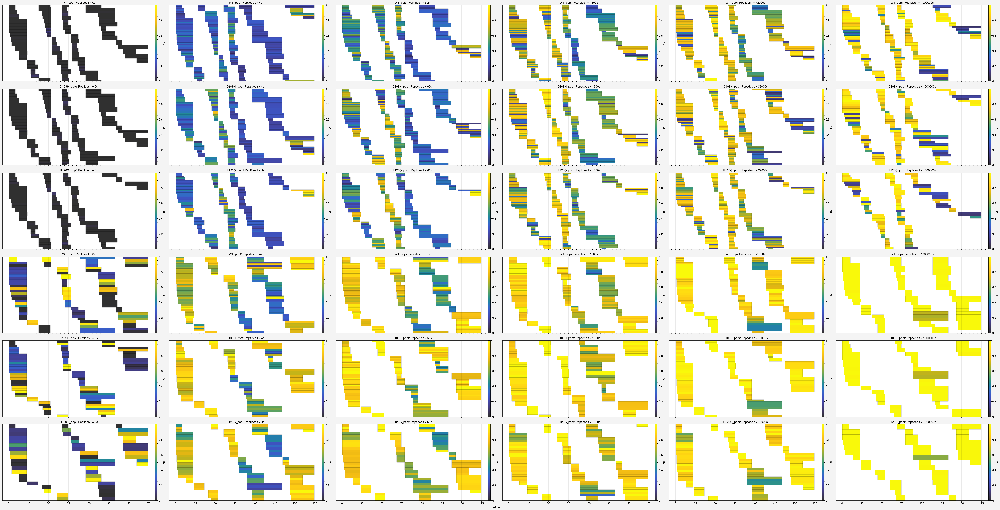

In [4]:
# These plots aren't included in the paper but are useful for qualitative assessments of the data quality

# states = ['WT_pop1','D109H_pop1','R120G_pop1',
#           'WT_pop2','D109H_pop2','R120G_pop2',] #defined when data read in
times = hdxm_hxex[projects[0]]['WT_pop1'].timepoints#[1:]

for proj in projects:
    plot_coverage(hdxm_hxex[proj],states=states12[proj],times=times)

# coverage plots but with the ~average population~ calculated the same way as rfu
# for proj in projects:
#     #plot_coverage(hdxm_hxex[proj],states=states12[proj],times=times,peprange = [50,70],color_field='rfu')
#     plot_coverage(hdxm_hxex[proj],states=states12[proj],times=times,color_field='pop')

# coverage plots only select peprange peptides 
# for proj in projects[2:4]:
#     plot_coverage(hdxm_hxex[proj],states=states12[proj],times=times,peprange = [20,30],color_field='rfu')

#     plot_coverage(hdxm_hxex[proj],states=states12[proj],times=times,peprange = [20,30],color_field='pop')


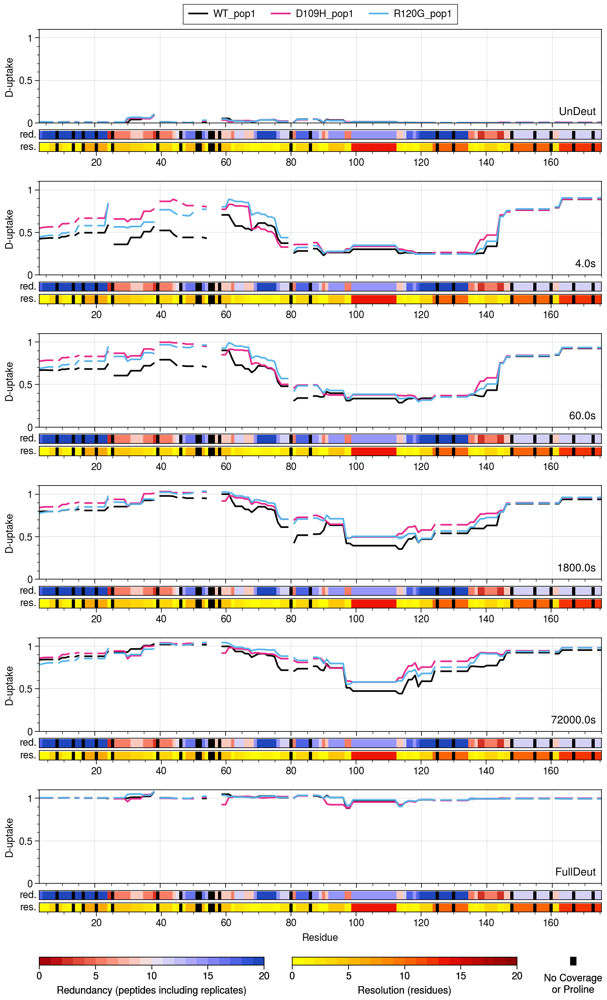

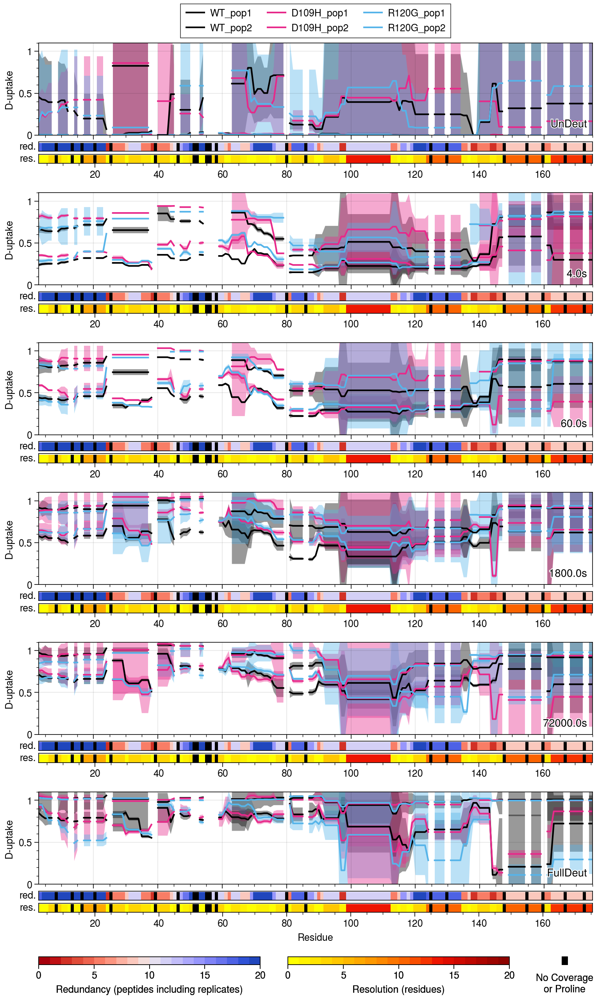

In [5]:
# plot the fixed1pop and fixed2pops data
colors="#000000 #66C2A5 #56B4E9 #7570B3 #E7298A".split()
colors = [colors[i] for i in [0,-1,2]]
# states = ['WT_pop1','D109H_pop1','R120G_pop1',
#           'WT_pop2','D109H_pop2','R120G_pop2',]

for proj in projects:
    plot_rfu_residue(hdxm_hxex[proj],colors=colors,states=states12[proj],legendcols=3,seq=sequence)

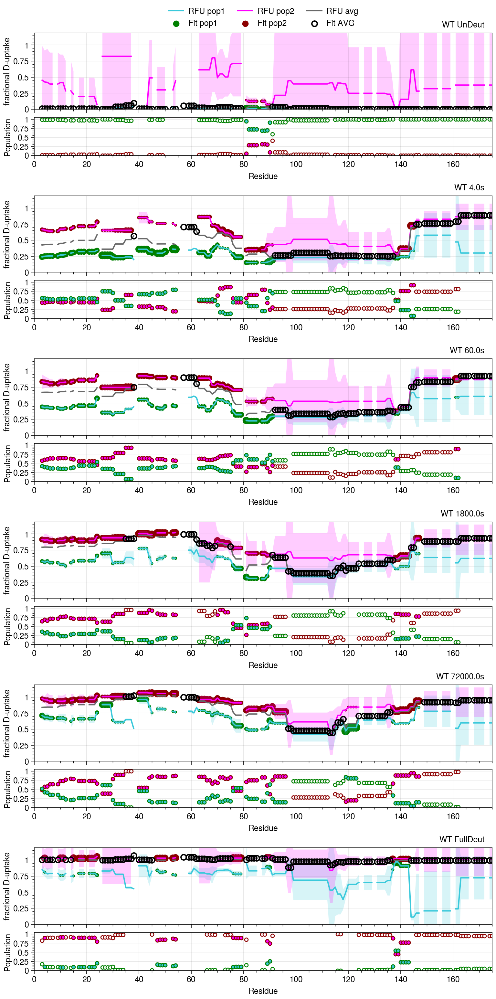

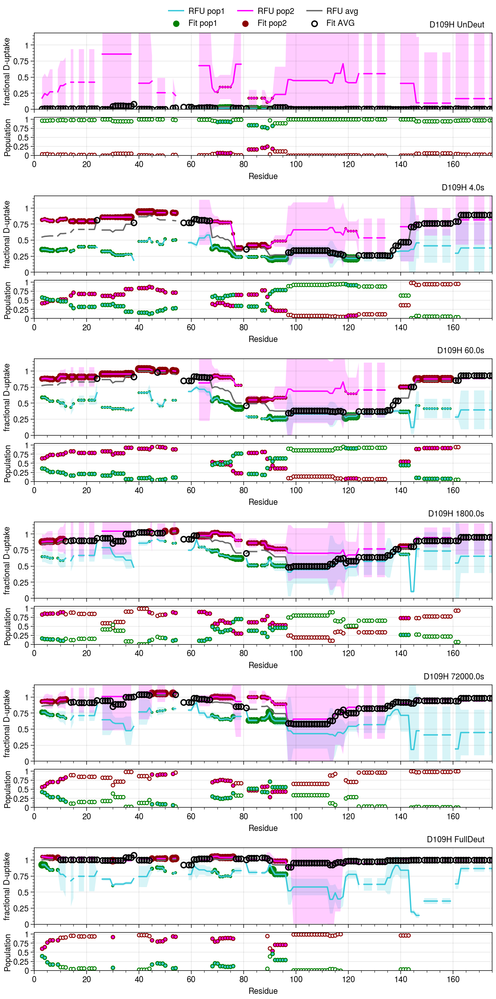

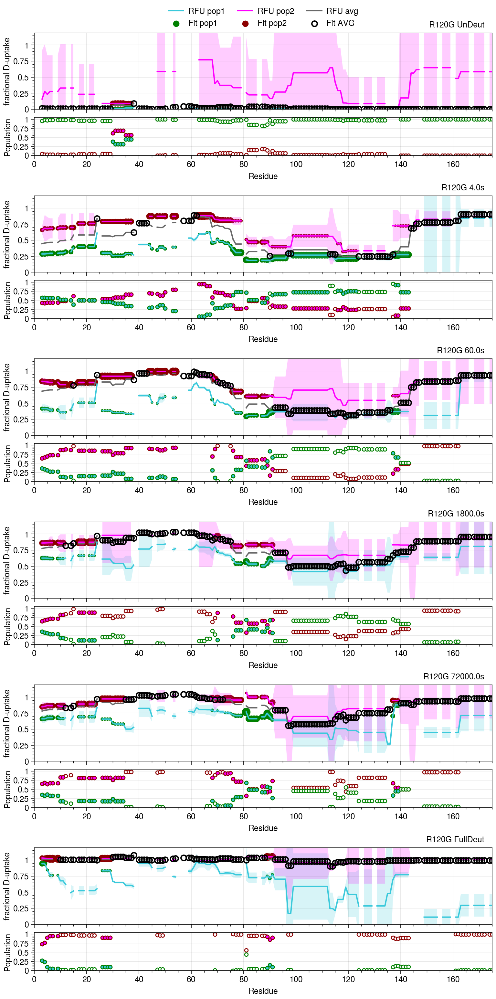

In [6]:
# Fit the 
#state = 'B1'
times = [0,4,60,1800,72000,1e6] #sec
max_sd = 0.50 #maximum allowed error on any population fit, if too large falls back to 'avg'
min_pop = 0.05 #minimum population, if too small rolls back to 'avg' 
                # need to check that not keeping both avg and larger of the pop1 or pop2 fixed2pops fits
z = '50'

# samples1 = []
# for k in substates['fixed1pop'].keys():
#     sk = [s.rsplit('_',1)[0] for s in substates['fixed1pop'][k]]
#     samples1 += sk

fits = defaultdict(dict)
for state in samples['fixed1pop']:
    savepath = os.path.join(proj_dir,'B5_dismut_choosefits_'+state+'_'+date+'.svg')
    fits[state] = choose_fits(hdxm_hxex,state=state,times=times,z=z,min_pop=min_pop,max_sd=max_sd,plot=True,plotpop=True,return_fits=True,savepath=savepath,svg=True)

fitsdf = pd.DataFrame()
for sample in fits.keys():
    for time in fits[sample].keys():
        fit_df = pd.DataFrame(fits[sample][time])
        fit_df['sample'] = sample 
        fit_df['exposure'] = time
        fitsdf = pd.concat([fitsdf,fit_df.reset_index()],ignore_index=True)

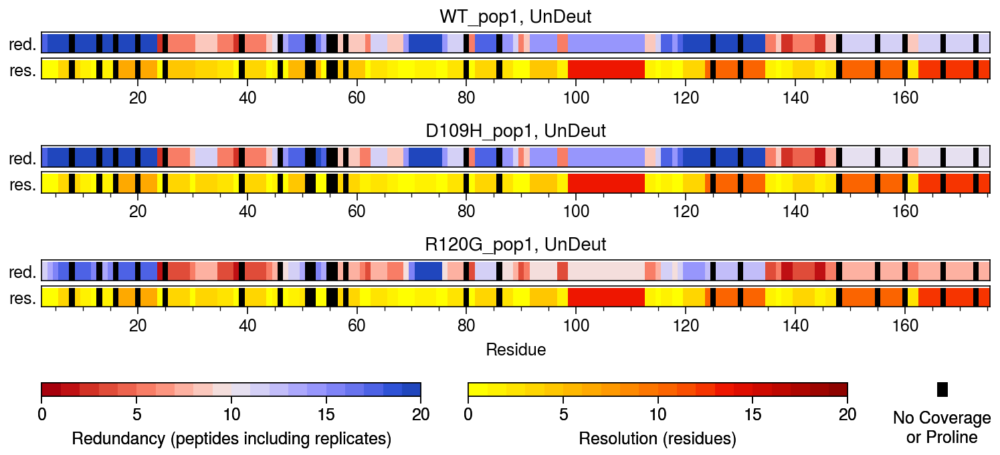

In [7]:
#for proj in projects:
#    plot_rfu_residue(hdxm_hxex[proj],colors=colors,states=states12[proj],legendcols=3,seq=sequence)
savepath = os.path.join(proj_dir,'B5_dismut_resred_plots_'+date+'.svg')
plot_resred(hdxm_hxex['fixed1pop'],states=['WT_pop1','D109H_pop1','R120G_pop1'],times=[0],seq=sequence,savepath=savepath,svg=True)


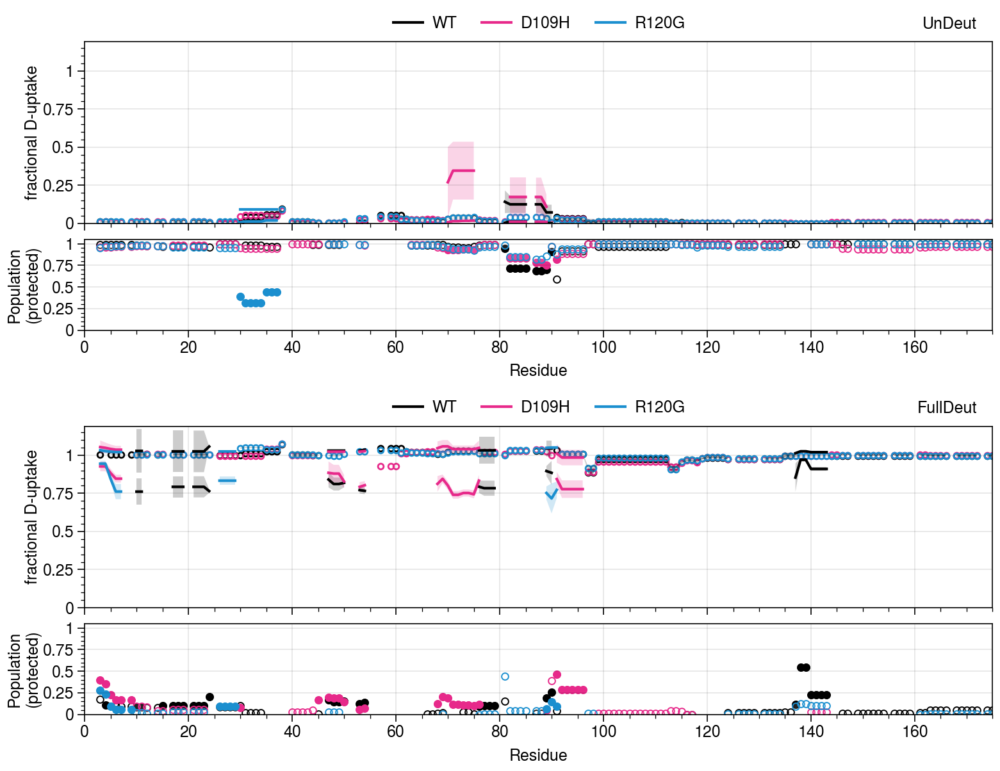

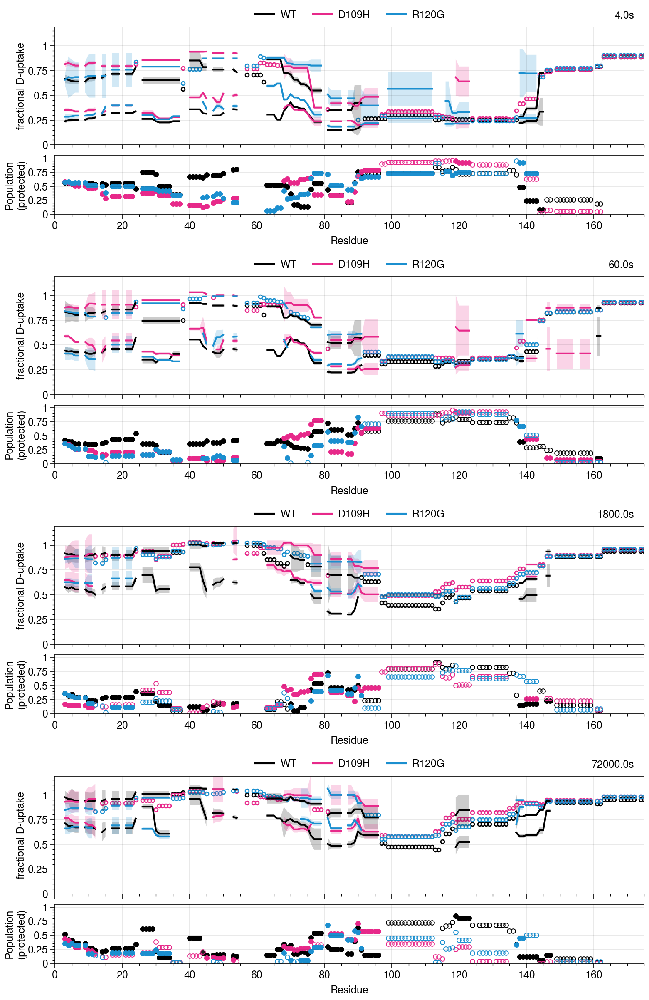

In [8]:
colors="#000000 #66C2A5 #1B8FCF #7570B3 #E7298A".split()
#colors="#000000 #66C2A5 #56B4E9 #7570B3 #E7298A".split()
colors = [colors[i] for i in [0,-1,2]]
# times = [k for k in fits['WT'].keys()]
# for use_time in times:
#     plot_comparison(fits,colors=colors,times=[use_time])
savepath = os.path.join(proj_dir,'B5_dismut_comparison_plots_UnTD_'+date+'.svg')
plot_comparison(fits,colors=colors,times=[0,1e6],savepath=savepath,svg=True)
savepath = os.path.join(proj_dir,'B5_dismut_comparison_plots_timepts_'+date+'.svg')
plot_comparison(fits,colors=colors,times=[4,60,1800,72000],savepath=savepath,svg=True)

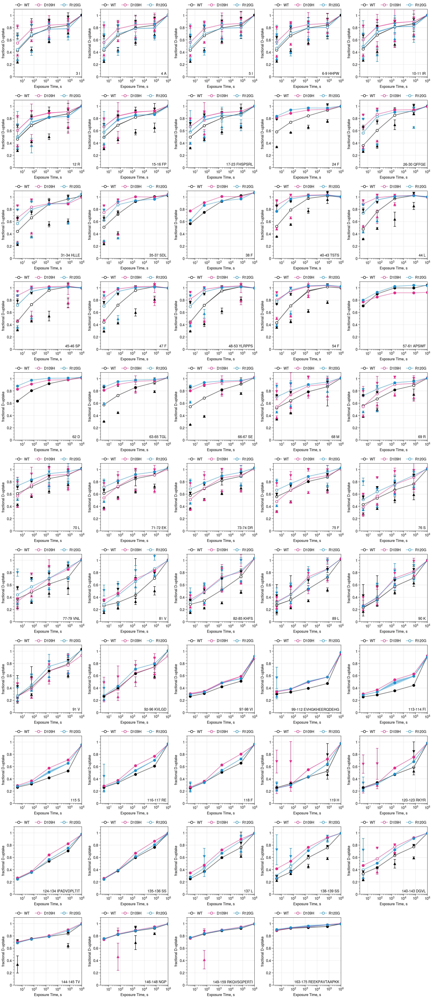

In [9]:
# Plot by Exposure time
# 
ref_state = 'WT'
block = hdxm_hxex['fixed1pop'][ref_state+'_pop1'].coverage.block_length
#print(block)
seq = sequence[ref_state+'_pop1']
start_res = 3
resb = []
seq_b = []
groups_minblock = {}
for i,b in enumerate(block):
    resb += [start_res + sum(block[0:i])]
#print(resb)

for idx in range(start_res-1):
    seq_b += [-1]
for idx in range(len(resb)-1):
    for subb in range(resb[idx],resb[idx+1]): #subb will count from block start residue to next 
        seq_b += [idx]
for idx in range(resb[-1],len(seq)+1):
    seq_b += [len(resb)-1]

#First make sure each block actually has data
resb_filt = []
for resi in resb: #step through each of the start residues to check for data in that block
    #lookup block
    blocki = seq_b[resi-1] #seq_b identifies what block each residue is in 
    residx = [index for index, value in enumerate(seq_b) if value == blocki] #residx is all residues within the resi block 

    for ridx in residx:
        use_data = fitsdf[(fitsdf['sample']==sample) & (fitsdf['r_number'] == resi)].copy()
        if np.any(~np.isnan(use_data['RFU_avg'])):
            resb_filt += [ridx+1]
            break #the first residue in the block has data so we are okay

#resi = 54
z_value ={'50':0.674,'68':1.0,'sd':1.0,'80':1.282,'90':1.645,'95':1.96,'98':2.326,'99':2.576}
ncols = 5
#resb_filt=resb_filt[30:] #resb_filt[0:30] #plot page A or B 
nrows = len(resb_filt) // ncols + min(len(resb_filt) % ncols,1)
leftovers = len(resb_filt)%ncols #ncols - 
row = 0
col = 0
iblock = 0
fig, ax = pplt.subplots(nrows=nrows,ncols=ncols,  axwidth="60mm", sharex=False, sharey=False, )
for resi in resb_filt:
    #lookup block
    blocki = seq_b[resi-1]
    residx = [index for index, value in enumerate(seq_b) if value == blocki]
    seq_block = ''.join([seq[i] for i in residx])
    first = str(residx[0]+1)+"-" if len(residx) > 1 else ''
    last = str(residx[-1]+1)
    seq_label = first+last+' '+seq_block
    groups_minblock[seq_label] = first+last

    for i,sample in enumerate(samples['fixed1pop']):
        use_data = fitsdf[(fitsdf['sample']==sample) & (fitsdf['r_number']==resi)].copy() # & (fitsdf['exposure'] > 0)        
        use_data.loc[use_data['exposure']==1e6,['RFU_pop1','RFU_pop2','Fit_pop1','Fit_pop2']] = np.nan #don't plot nonsense 2-state for TD
        use_data.loc[use_data['exposure']==0,['RFU_avg','Fit_AVG']] = np.nan #don't draw line towards zero (looks misleading on log scale)
        # ax[row,col].scatter(use_data['exposure'].values,use_data['RFU_pop1'].values,bardata=use_data['pop1_sd']*z_value['50'],
        #                     edgecolor=colors[i],facecolor='white',marker='^',barc=colors[i]+"FF")
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_pop1'].values,color=colors[i],marker='^',zorder=10,
                            bardata=use_data['pop1_sd']*z_value['50'],barc=colors[i]+"FF")

        # ax[row,col].scatter(use_data['exposure'].values,use_data['RFU_pop2'].values,bardata=use_data['pop2_sd']*z_value['50'],
        #                     edgecolor=colors[i],facecolor='white',marker='v',barc=colors[i]+"FF")
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_pop2'].values,color=colors[i],marker='v',zorder=10,
                            bardata=use_data['pop2_sd']*z_value['50'],barc=colors[i]+"FF")
        
        ax[row,col].line(use_data['exposure'].values,use_data['RFU_avg'].values,shadedata=use_data['avg_sd']*z_value['sd'],
                         color=colors[i]+"80",mec=colors[i],mfc='white',marker='o',label=sample)
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_AVG'].values,color=colors[i],marker='o',zorder=10) 
        ax[row,col].format(xscale='log',xformatter='log',ylabel='fractional D-uptake',xlabel='Exposure Time, s',ylim=(0,1.1),)#xlim=(0,2e6))  
    
    ax[row,col].text( 7.2e5,0.02,seq_label,horizontalalignment='right',verticalalignment='bottom',)
    handles,labels=ax[row,col].get_legend_handles_labels()
    ax[row,col].legend(handles=handles,ncols=len(samples['fixed1pop']),bbox_to_anchor=(0.5,1.06),loc='center', #units fraction of figure
                        frame=True,edgecolor='white',facecolor='white',framealpha=0.8);

    iblock = iblock + 1
    col = iblock % ncols
    row = iblock //ncols
fig.set_facecolor('white')
if leftovers > 0:
    for rc in np.arange(leftovers,ncols):fig.delaxes(ax[-1,rc]) #delete empty plots
fig.savefig(os.path.join(proj_dir,'B5_disease_popsFit_RFUvsTime_minblockB_'+date+'.pdf'),format='pdf')
fig.savefig(os.path.join(proj_dir,'B5_disease_popsFit_RFUvsTime_minblockB_'+date+'.svg'),format='svg')

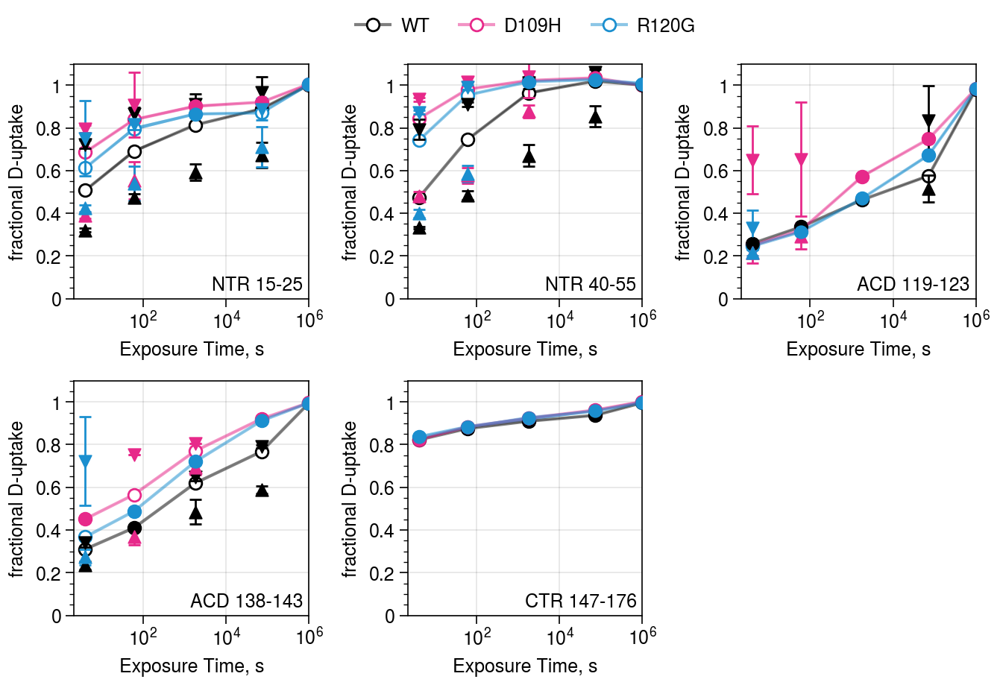

In [11]:
# Plot by Exposure time for custom groups
# 

groups = {'NTR 15-25':'15-25','NTR 40-55':'40-55','ACD 119-123':'119-123','ACD 138-143':'138-143','CTR 147-176':'147-176'}

groupfits_df = group_fits(fitsdf,groups)

#prettycols = ['$fD_(slow)$','$fD_(fast)$','$fD_(avg)$','$pop_(slow)$','$pop_(fast)$'] #not working
prettycols = ['fDavg','fDslow','fDfast','pop_slow','pop_fast']
groupfits_df[prettycols[1]] = groupfits_df.apply(lambda x: "{:0.2f}".format(x['Fit_pop1']) + " ± " "{:0.2f}".format(x['pop1_sd']) 
                                            if ~np.isnan(x['Fit_pop1']) else 'nan',axis=1)
groupfits_df[prettycols[2]] = groupfits_df.apply(lambda x: "{:0.2f}".format(x['Fit_pop2']) + " ± " "{:0.2f}".format(x['pop2_sd']) 
                                            if ~np.isnan(x['Fit_pop2']) else 'nan',axis=1)
groupfits_df[prettycols[0]] = groupfits_df.apply(lambda x: "{:0.2f}".format(x['RFU_avg']) + " ± " "{:0.2f}".format(x['avg_sd']) 
                                            if ~np.isnan(x['RFU_avg']) else 'nan',axis=1)
groupfits_df[prettycols[3]] = groupfits_df.apply(lambda x: "{:0.2f}".format(x['pop1']) + " ± " "{:0.2f}".format(x['p1_sd']) 
                                            if ~np.isnan(x['RFU_avg']) else 'nan',axis=1)
groupfits_df[prettycols[4]] = groupfits_df.apply(lambda x: "{:0.2f}".format(1-x['pop1']) + " ± " "{:0.2f}".format(x['p1_sd']) 
                                            if ~np.isnan(x['RFU_avg']) else 'nan',axis=1)

colors="#000000 #66C2A5 #1B8FCF #7570B3 #E7298A".split()
#colors="#000000 #66C2A5 #56B4E9 #7570B3 #E7298A".split()
colors = [colors[i] for i in [0,-1,2]]

ncols = 3
nrows = len(groups) // ncols + min(len(groups) % ncols,1)
leftovers = len(groups)%ncols
row = 0
col = 0
iblock = 0
fig, ax = pplt.subplots(nrows=nrows,ncols=ncols,  axwidth="40mm", sharex=False, sharey=False, )
for group,v in groups.items():

    seq_label = group # label plots with Group Name
    resgroup = get_residues(v) # residues in group

    for i,sample in enumerate(samples['fixed1pop']):
        use_data = groupfits_df[(groupfits_df['sample']==sample) & (groupfits_df['Group'] == group)].copy()       
        use_data.loc[use_data['exposure']==1e6,['RFU_pop1','RFU_pop2','Fit_pop1','Fit_pop2']] = np.nan #don't plot nonsense 2-state for TD
        use_data.loc[use_data['exposure']==0,['RFU_avg','Fit_AVG']] = np.nan #don't draw line towards zero (looks misleading on log scale)
       

        # ax[row,col].scatter(use_data['exposure'].values,use_data['RFU_pop1'].values,bardata=use_data['pop1_sd']*z_value['50'],
        #                     edgecolor=colors[i],facecolor='white',marker='^',barc=colors[i]+"FF")
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_pop1'].values,color=colors[i],marker='^',zorder=10,
                            barc=colors[i]+"FF",bardata=use_data['pop1_sd']*z_value['50'])

        # ax[row,col].scatter(use_data['exposure'].values,use_data['RFU_pop2'].values,bardata=use_data['pop2_sd']*z_value['50'],
        #                     edgecolor=colors[i],facecolor='white',marker='v',barc=colors[i]+"FF")
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_pop2'].values,color=colors[i],marker='v',zorder=10,
                            barc=colors[i]+"FF",bardata=use_data['pop2_sd']*z_value['50'])
        
        ax[row,col].line(use_data['exposure'].values,use_data['RFU_avg'].values,shadedata=use_data['avg_sd']*z_value['sd'],
                         color=colors[i]+"80",mec=colors[i],mfc='white',marker='o',label=sample)
        ax[row,col].scatter(use_data['exposure'].values,use_data['Fit_AVG'].values,color=colors[i],marker='o',zorder=10) 
        
        
        ax[row,col].format(xscale='log',xformatter='log',ylabel='fractional D-uptake',xlabel='Exposure Time, s',ylim=(0,1.1),)#xlim=(0,2e6))
    handles,labels=ax[row,col].get_legend_handles_labels()
    # ax[row,col].legend(handles=handles,ncols=len(samples['fixed1pop']),bbox_to_anchor=(0.5,1.06),loc='center', #units fraction of figure
    #                     frame=True,edgecolor='white',facecolor='white',framealpha=0.8);
    ax[row,col].text( 7.2e5,0.02,seq_label,horizontalalignment='right',verticalalignment='bottom',)

    iblock = iblock + 1
    col = iblock % ncols
    row = iblock //ncols
fig.legend(handles=handles,ncols=3,loc='top', #units fraction of figure
                         frame=True,edgecolor='white',facecolor='white',framealpha=0.8);
fig.set_facecolor('white')
if leftovers > 0:
    for rc in np.arange(leftovers,ncols):fig.delaxes(ax[-1,rc]) #delete empty plots   

fig.savefig(os.path.join(proj_dir,'B5_disease_popsFit_RFUvsTime_selectregions_'+date+'.pdf'),format='pdf')
fig.savefig(os.path.join(proj_dir,'B5_disease_popsFit_RFUvsTime_selectregions_'+date+'.svg'),format='svg')